<a href="https://colab.research.google.com/github/luismanriqueruiz/machine_learning/blob/main/Testing_EasyOCR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Testing EasyOCR

## Goal:
The goal of this notebook is to test this library and perform some image preprocessing steps to improve accuracy.


In [1]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install japanize-matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import easyocr
import cv2
from PIL import Image
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import patches
import japanize_matplotlib

## Image 01

In [4]:
reader = easyocr.Reader(['ja','en'], gpu = True)

In [5]:
image_path = '/content/drive/MyDrive/Colab_Notebooks/Zeals/ocr/p01.png'
result = reader.readtext(image_path)

限定観造
1
講
SAPPORO
IWippEoirTE
Jlts YDJ
GWinGexprpleo
5の TWBWpToTWEUSF
サッボロ生ビール
サボロ生ビ;
@足 道
黒ラベル おえ
黒ラベル
サッボロ生ピール
大人の大生
黒ラベル
サッボロ生ヒール
黒ラベル
卵
生のうまさにこだわり統ける黒ラベルだからこそ 常に 目指すのは 「完壁」なうまさ。
それは 麦のうまみと爽やかな後味の完壁なバランス。味や香りを新鮮に保つクリーミーな池。
何林飲んで6飲み飽きない ビール好きの大人たちに愛されるビールヘ。
SAPPORO
御9川


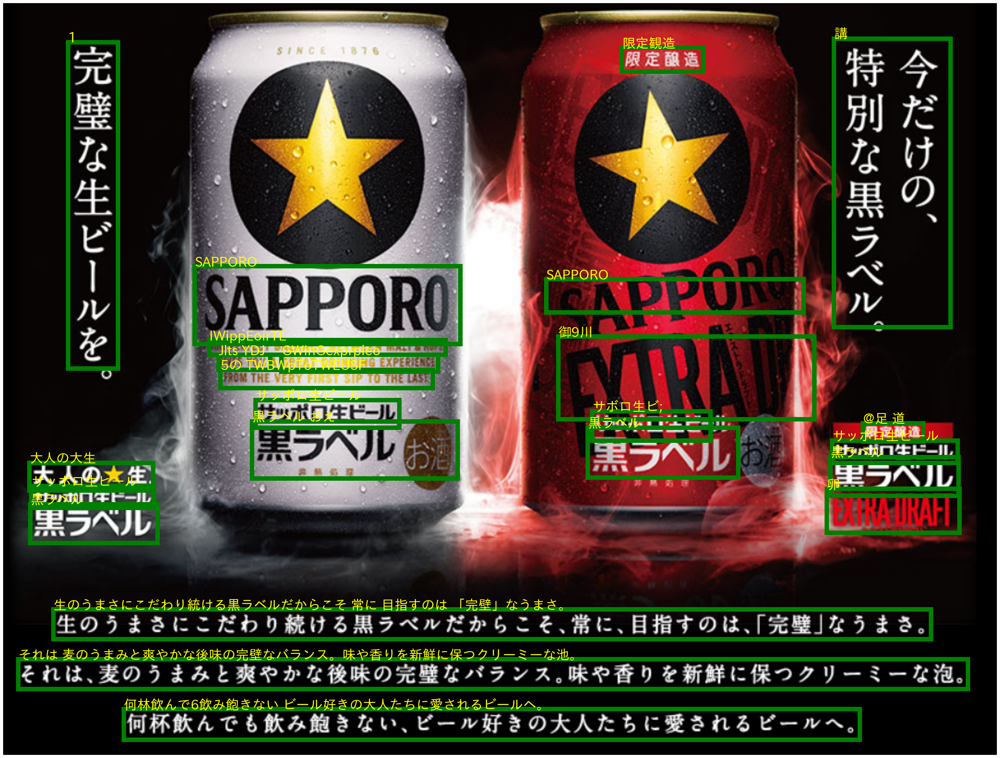

In [6]:
image = Image.open(image_path)
figsize = (40, 40)

fig = plt.figure(figsize = figsize)
ax = plt.axes()
ax.imshow(image)
ax.axis("off")

for t in result:
    try:
        bbox = np.array(t[0])
        print(t[1])
        #ax.text(bbox[0,0], bbox[0,1], t[1], size=30, fontname="IPAothic", color="green")
        r = patches.Rectangle(xy=(bbox[0,0], bbox[0,1]), width=(bbox[2,0] - bbox[0,0]), height=(bbox[2,1] - bbox[0,1]), ec='g', fill=False,linewidth='10.0')
        ax.add_patch(r)
        ax.text(bbox[0,0], bbox[0,1], t[1], size=30, color="yellow")
    except:
        continue

#plt.savefig('./result.png')

### Adding preprocessing

In [7]:
type(image)

PIL.PngImagePlugin.PngImageFile

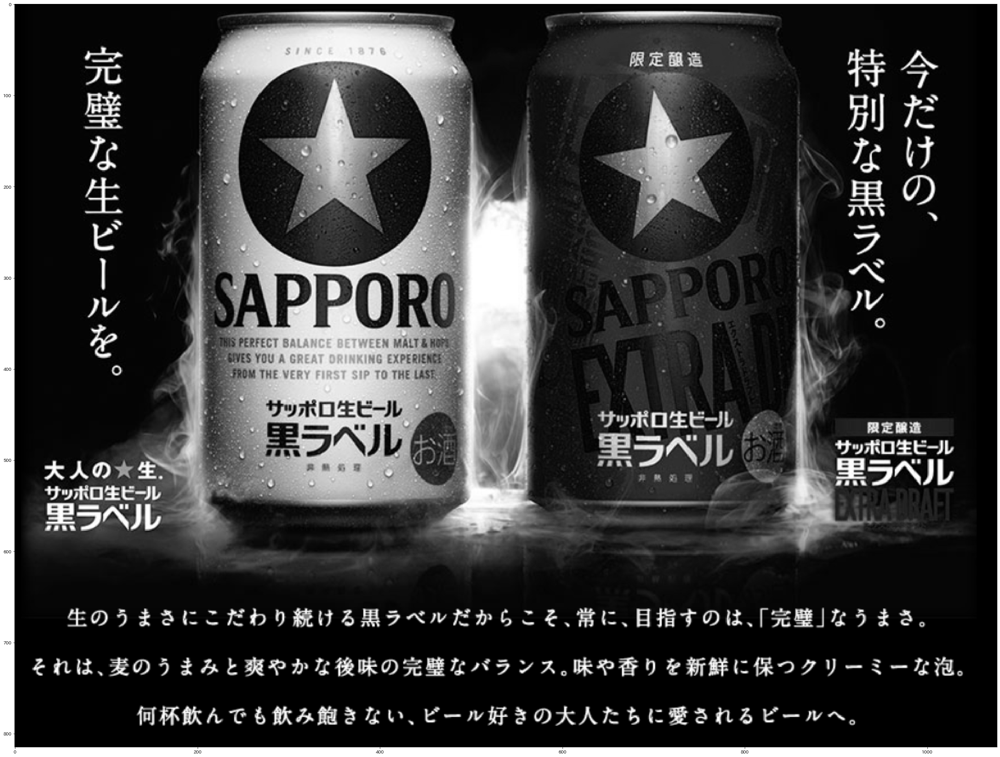

In [8]:
gray_image = cv2.cvtColor(np.array(image), cv2.COLOR_BGR2GRAY)

plt.figure(figsize=figsize)
plt.imshow(gray_image, interpolation='nearest', cmap='gray', vmin=0, vmax=255)
plt.show()

限定観造
1
講
SAPPORO
tipECTDALAWPE DFTWWFEWIhIT』B
Ws YDUA GPEATDWWWhlWGExptplEWoi
【りTHEVERY FIRST SIP TOTMEuSF
m
サッボロ生ビール
サッボロ生ヒール
凪定賀道
黒ラベル'
黒ラベル
サッボロ生ピール
大人の大生
黒ラベル
サッボロ生ヒ-ル
黒ラベル
WSn
生のうまさにこだわり統ける黒ラベルだからこそ 常に 目指すのは 「完壁」なうまさ。
それは 麦のうまみと爽やかな後味の完壁なバランス。味や香りを新鮮に保つクリーミーな池。
何林飲んで6飲み飽きない ビール好きの大人たちに愛されるビールヘ。
3APpOR }


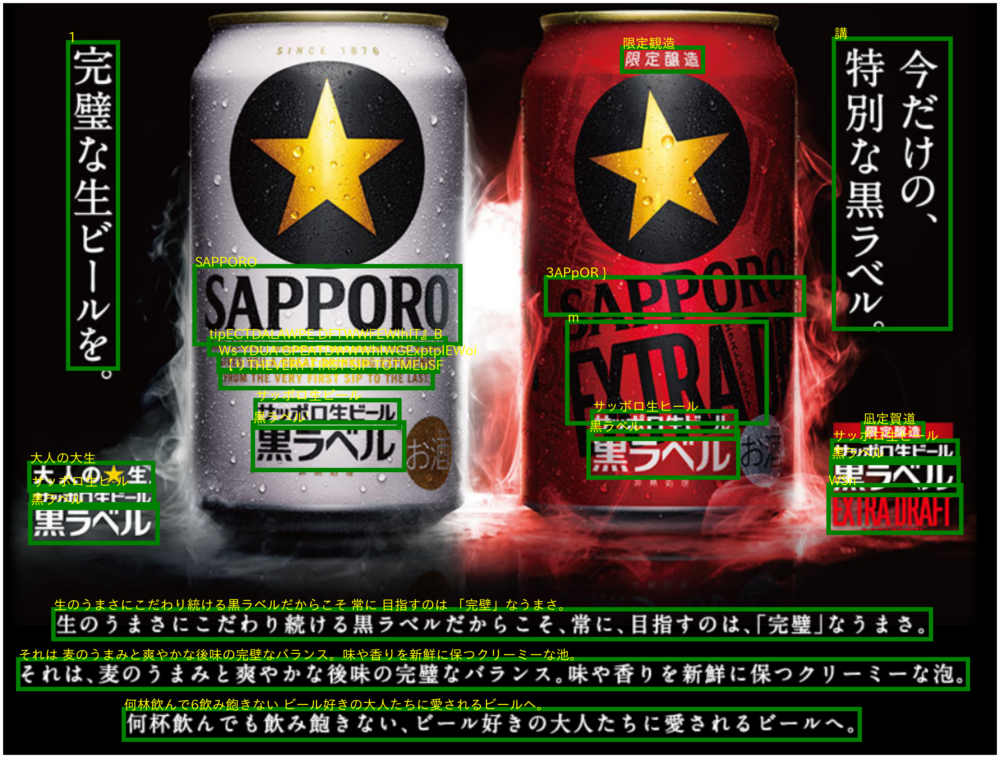

In [9]:
result = reader.readtext(gray_image)

fig = plt.figure(figsize = figsize)
ax = plt.axes()
ax.imshow(image)
ax.axis("off")

for t in result:
    try:
        bbox = np.array(t[0])
        print(t[1])
        #ax.text(bbox[0,0], bbox[0,1], t[1], size=30, fontname="IPAothic", color="green")
        r = patches.Rectangle(xy=(bbox[0,0], bbox[0,1]), width=(bbox[2,0] - bbox[0,0]), height=(bbox[2,1] - bbox[0,1]), ec='g', fill=False,linewidth='10.0')
        ax.add_patch(r)
        ax.text(bbox[0,0], bbox[0,1], t[1], size=30, color="yellow")
    except:
        continue

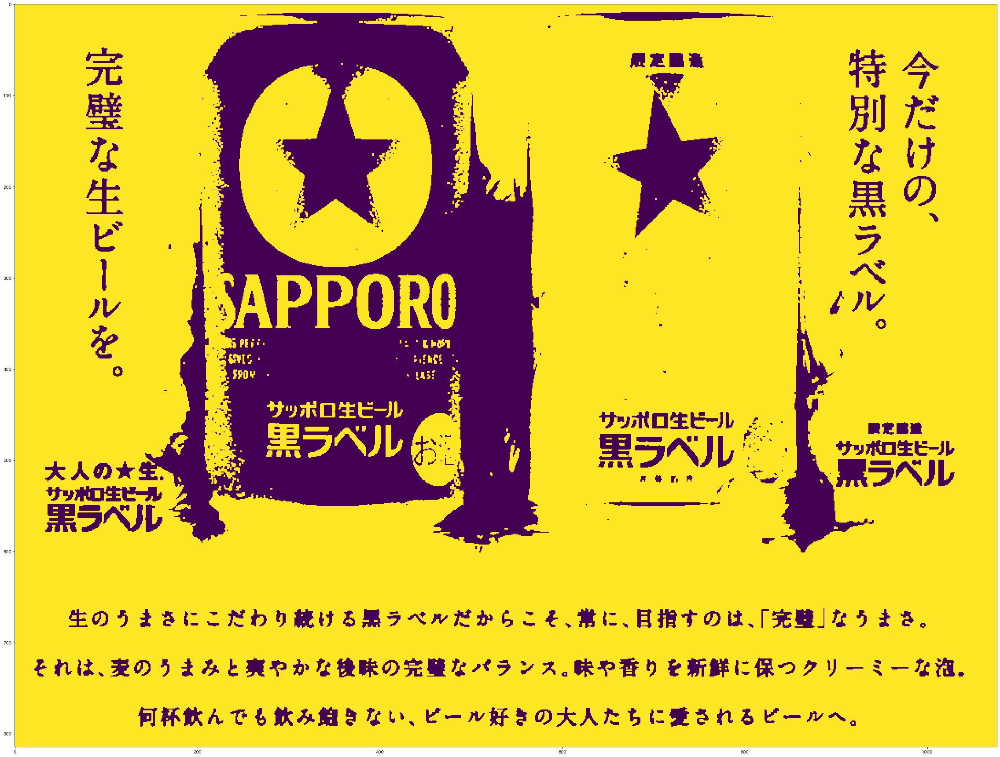

In [10]:
binary_image = cv2.threshold(gray_image , 50, 225,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
 
#Inverting the image
inverted_bin = cv2.bitwise_not(binary_image)

#Some noise reduction
kernel = np.ones((2,2),np.uint8)
processed_img = cv2.erode(inverted_bin, kernel, iterations = 1)
processed_img = cv2.dilate(processed_img, kernel, iterations = 1)

plt.figure(figsize=figsize)
plt.imshow(processed_img, interpolation='nearest')
plt.show()

In [11]:
result = reader.readtext(processed_img)
result

[([[72, 42], [126, 42], [126, 394], [72, 394]], '1', 0.9121632948845217),
 ([[899, 37], [1031, 37], [1031, 355], [899, 355]],
  'y',
  0.0014821062768968218),
 ([[218, 286], [494, 286], [494, 366], [218, 366]],
  'SAPPOR',
  0.505516954254534),
 ([[245, 365], [273, 365], [273, 381], [245, 381]], 'eii', 0.3129967574768871),
 ([[455, 367], [481, 367], [481, 381], [455, 381]], '川町', 0.11636357557051923),
 ([[235, 383], [263, 383], [263, 399], [235, 399]],
  'yV',
  0.005478187973553069),
 ([[435, 383], [473, 383], [473, 399], [435, 399]],
  'iばnr',
  0.4976464807987213),
 ([[239, 401], [267, 401], [267, 415], [239, 415]],
  'パげ',
  0.005013050773172308),
 ([[439, 401], [465, 401], [465, 415], [439, 415]],
  '山お',
  0.0005748076259106269),
 ([[274, 432], [430, 432], [430, 462], [274, 462]],
  'サッボロ生ヒール',
  0.8365721129796055),
 ([[638, 444], [794, 444], [794, 474], [638, 474]],
  'サッボロ生ピール',
  0.5827301203526878),
 ([[272, 454], [434, 454], [434, 506], [272, 506]],
  '黒ラベル',
  0.9969154000

1
y
SAPPOR
eii
川町
yV
iばnr
パげ
山お
サッボロ生ヒール
サッボロ生ピール
黒ラベル
黒ラベル
妙ッが口生ヒ-ル
大人の女生
ラベル
サッd生1 }
兼ゅ
生のうきさにこだわり義けち黒ラべんだからこそ 常に 目すのけ 「先皇」なうきさ。
それは 芙のうまみと泉やかな食味の荒豊なパランス。味や斉りそ新鮮に保つクリーミーなど;
何称似んでも似ヶ的目ない ビール好きの大人たちにたされるビールヘー


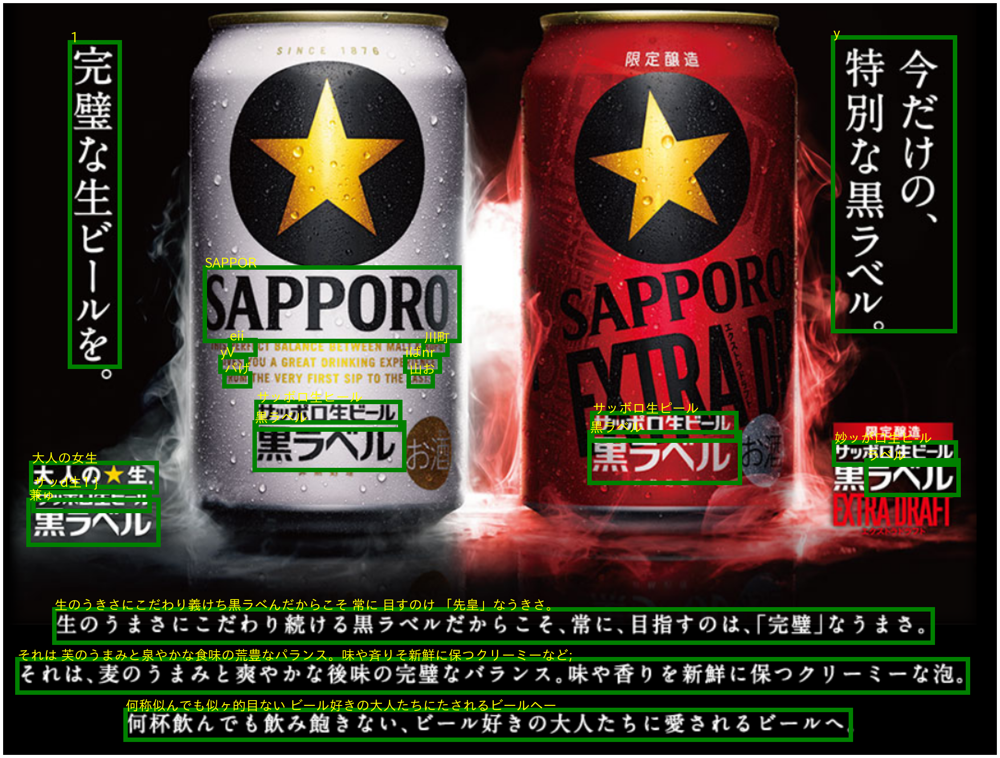

In [12]:
fig = plt.figure(figsize = figsize)
ax = plt.axes()
ax.imshow(image)
ax.axis("off")

for t in result:
    try:
        bbox = np.array(t[0])
        print(t[1])
        #ax.text(bbox[0,0], bbox[0,1], t[1], size=30, fontname="IPAothic", color="green")
        r = patches.Rectangle(xy=(bbox[0,0], bbox[0,1]), width=(bbox[2,0] - bbox[0,0]), height=(bbox[2,1] - bbox[0,1]), ec='g', fill=False,linewidth='10.0')
        ax.add_patch(r)
        ax.text(bbox[0,0], bbox[0,1], t[1], size=30, color="yellow")
    except:
        continue

## Image 02

楽天市場トップ > サッボロビール
ちを
$っとりぃい
SAPPoRo
Campaignol
Srcium
アンケート回答&対象商品職入で
SAPPORO
YEBISU
『ISTW
Lnnii
ルタ
~
次回の膳入に使える/
エルトスター
@川・ アヒスビール
ShppoRo
じ-
一
Jtooon
一ル川川
'町川
田
300円
OEE
三ッ星
麦
グレフルサワ
クーポン】
ご'
汲進星するクーポンは期間限定です上限や条件の詩畑はこちとから_
歩ピンク
川l
~・
ストップ【20ー床満欲酒 飲酒に転。
好し中や援乳期の飲涌はやめましょうっお酒は兼しく適口で。
のんだあとはリサイクル。
サッボロビールけ八会社
サッポロの人気
商品に使える:
こ
美かu『
繁
ルルク
イにくて


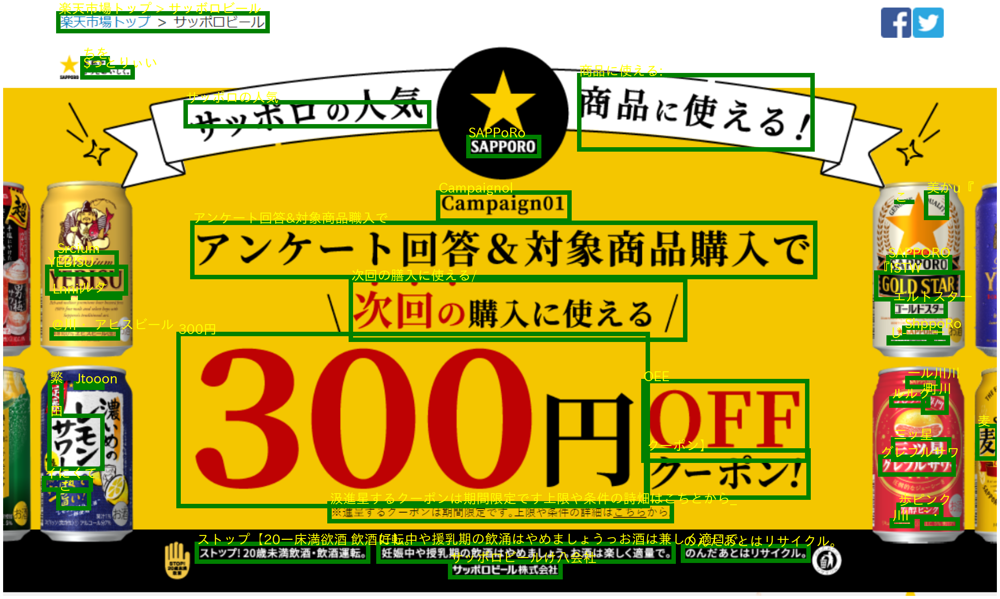

In [13]:
image_path = '/content/drive/MyDrive/Colab_Notebooks/Zeals/ocr/p02.png'
result = reader.readtext(image_path)

image = Image.open(image_path)

fig = plt.figure(figsize = (40,40))
ax = plt.axes()
ax.imshow(image)
ax.axis("off")

for t in result:
    try:
        bbox = np.array(t[0])
        print(t[1])
        #ax.text(bbox[0,0], bbox[0,1], t[1], size=30, fontname="IPAothic", color="green")
        r = patches.Rectangle(xy=(bbox[0,0], bbox[0,1]), width=(bbox[2,0] - bbox[0,0]), height=(bbox[2,1] - bbox[0,1]), ec='g', fill=False,linewidth='10.0')
        ax.add_patch(r)
        ax.text(bbox[0,0], bbox[0,1], t[1], size=30, color="yellow")
    except:
        continue

#plt.savefig('./result.png')

## Image 03

特別な味と経験を
おせち集
集
お得なクーポン
配布中!


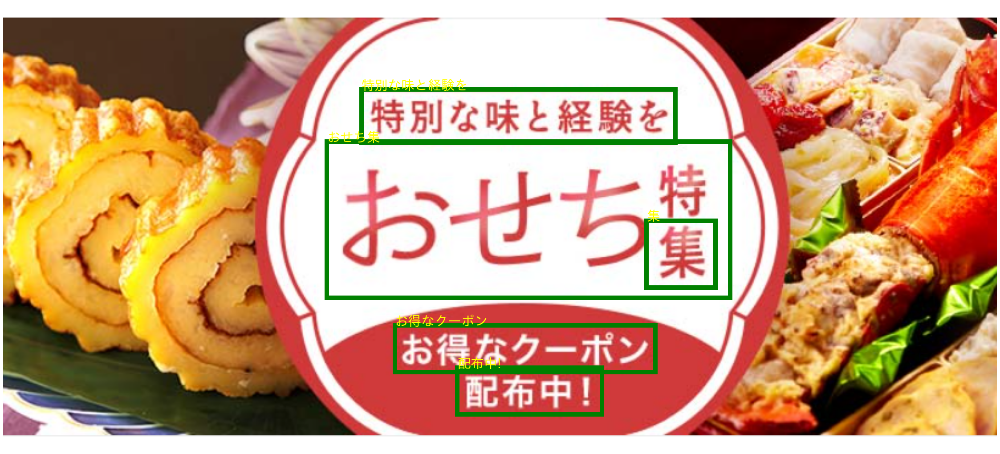

In [14]:
image_path = '/content/drive/MyDrive/Colab_Notebooks/Zeals/ocr/p03.png'
result = reader.readtext(image_path)

image = Image.open(image_path)

fig = plt.figure(figsize = (40,40))
ax = plt.axes()
ax.imshow(image)
ax.axis("off")

for t in result:
    try:
        bbox = np.array(t[0])
        print(t[1])
        #ax.text(bbox[0,0], bbox[0,1], t[1], size=30, fontname="IPAothic", color="green")
        r = patches.Rectangle(xy=(bbox[0,0], bbox[0,1]), width=(bbox[2,0] - bbox[0,0]), height=(bbox[2,1] - bbox[0,1]), ec='g', fill=False,linewidth='10.0')
        ax.add_patch(r)
        ax.text(bbox[0,0], bbox[0,1], t[1], size=30, color="yellow")
    except:
        continue

#plt.savefig('./result.png')

## Image 04

エントリー必要
今シーズンも応援ありがとう:
楽天イグルス
EEnGLES
ポイント最大
感謝祭
PskuenEsglos
37借
:EGLES
PISlS
1
10/28
23:59まで


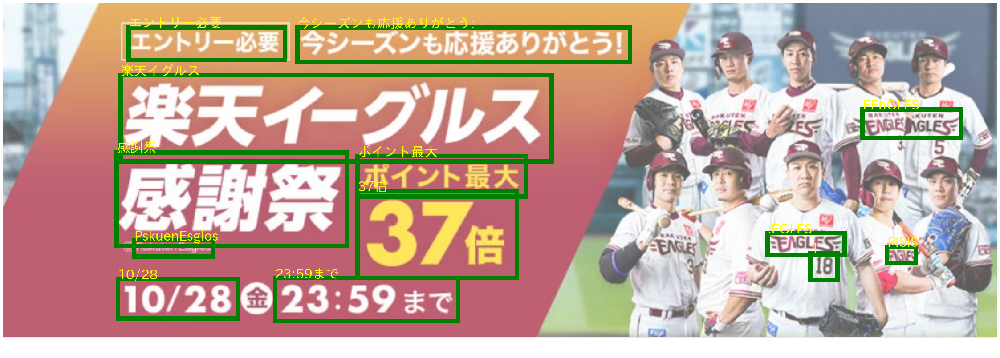

In [15]:
image_path = '/content/drive/MyDrive/Colab_Notebooks/Zeals/ocr/p04.png'
result = reader.readtext(image_path)

image = Image.open(image_path)

fig = plt.figure(figsize = (40,40))
ax = plt.axes()
ax.imshow(image)
ax.axis("off")

for t in result:
    try:
        bbox = np.array(t[0])
        print(t[1])
        #ax.text(bbox[0,0], bbox[0,1], t[1], size=30, fontname="IPAothic", color="green")
        r = patches.Rectangle(xy=(bbox[0,0], bbox[0,1]), width=(bbox[2,0] - bbox[0,0]), height=(bbox[2,1] - bbox[0,1]), ec='g', fill=False,linewidth='10.0')
        ax.add_patch(r)
        ax.text(bbox[0,0], bbox[0,1], t[1], size=30, color="yellow")
    except:
        continue

#plt.savefig('./result.png')

In [16]:
result

[([[139, 27], [313, 27], [313, 63], [139, 63]], 'エントリー必要', 0.2662401779779289),
 ([[327, 27], [697, 27], [697, 65], [327, 65]],
  '今シーズンも応援ありがとう:',
  0.405885554701748),
 ([[130, 80], [610, 80], [610, 176], [130, 176]],
  '楽天イグルス',
  0.43477699633534367),
 ([[956, 118], [1066, 118], [1066, 150], [956, 150]],
  'EEnGLES',
  0.01806708874580079),
 ([[394, 170], [581, 170], [581, 215], [394, 215]],
  'ポイント最大',
  0.9991002510554516),
 ([[126, 166], [382, 166], [382, 270], [126, 270]],
  '感謝祭',
  0.030466878006906152),
 ([[145, 264], [233, 264], [233, 282], [145, 282]],
  'PskuenEsglos',
  0.17243527236077338),
 ([[394, 209], [571, 209], [571, 306], [394, 306]],
  '37借',
  0.04320772640279316),
 ([[850, 256], [936, 256], [936, 280], [850, 280]],
  ':EGLES',
  0.16318423445896166),
 ([[983, 271], [1015, 271], [1015, 289], [983, 289]],
  'PISlS',
  0.06093739626189837),
 ([[898, 278], [928, 278], [928, 308], [898, 308]], '1', 0.6867688913173566),
 ([[127, 307], [261, 307], [261, 351], [127, 3